In [1]:
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

In [6]:
#load data from transalted json and switch the transalted-Content as 'Content'
df = pd.read_json('../../data/preprocessed/translated_results_en.json')

# Drop the "translatedContent" column
df.drop("Content", axis=1, inplace=True)

# Rename the "Content_in_de" column to replace the dropped column
df.rename(columns={"Content_in_en": "Content"}, inplace=True)

# Display the modified DataFrame
print(df)

     original_language                                            Content
0                   en  ARIVE | Your favorite brandsGet the appOur Vis...
1                   de  Reversal - of life insurance We get up to twic...
2                   de  Strong insurance for your lifestyle | helden.d...
3                   en    RESTUBE - the airbag for more freedom and sa...
4                   de  CureVac - We are revolutionizing mRNA for peop...
...                ...                                                ...
3275                de  LEMONSGATE Home Focus References Technologies ...
3276                de  Safily Skip Search Close Search Added to Cart ...
3277                de  Home | ICO-LUX Fraud Prevention About us Caree...
3278                en  Versus | Compare everything Categoriessmartpho...
3279                de  Self-storage Munich and throughout Germany | s...

[3258 rows x 2 columns]


In [3]:
# import packages
import re

# import pandas as pd
# import numpy as np

# import matplotlib.pyplot as plt
# import seaborn as sns

import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
nltk.download('stopwords')


from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import GaussianNB

# from skmultilearn.problem_transform import BinaryRelevance

[nltk_data] Downloading package stopwords to /Users/kathi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
# define functions

def cleanPunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]', r'', sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]', r' ', cleaned)
    cleaned = re.sub(r'[äÄ]', 'ä', cleaned)
    cleaned = re.sub(r'[öÖ]', 'ö', cleaned)
    cleaned = re.sub(r'[üÜ]', 'ü', cleaned)
    cleaned = cleaned.strip()
    return cleaned

def keepAlpha(sentence):
    alpha_sent = ""
    for word in sentence.split():
        alpha_word = re.sub('[^a-zA-ZäöüÄÖÜß]+', ' ', word, flags=re.UNICODE)
        alpha_sent += alpha_word
        alpha_sent += " "
    alpha_sent = alpha_sent.strip()
    return alpha_sent

def removeStopWords(sentence, stopwords):
    re_stop_words = re.compile(r"\b(" + "|".join(stop_words) + ")\\W", re.I)   
    return re_stop_words.sub(" ", sentence)

def stemming(sentence):
    stemSentence = ""
    for word in sentence.split():
        stem = stemmer.stem(word)
        stemSentence += stem
        stemSentence += " "
    stemSentence = stemSentence.strip()
    return stemSentence

# define stopwords
stop_words = set(stopwords.words(['english']))

# define stemmer
stemmer = SnowballStemmer('english')

df['Content'] = df['Content'].astype(str)
# apply functions
df['Content'] = df['Content'].str.lower()
df['Content'] = df['Content'].apply(cleanPunc)
df['Content'] = df['Content'].apply(keepAlpha)
df['Content'] = df['Content'].apply(removeStopWords, stopwords=stopwords)
df['Content'] = df['Content'].apply(stemming)

In [5]:
df

,original_language,Content
0,en,ariv favorit brandsget appour visionpartnershi...
1,de,revers life insur get twice much life pension ...
2,de,strong insur lifestyl helden de home product f...
3,en,restub airbag freedom safeti water restub skip...
4,de,curevac revolution mrna peopl live us us manag...
...,...,...
3275,de,lemonsg home focus refer technolog job contact...
3276,de,safili skip search close search ad cart qti vi...
3277,de,home ico lux fraud prevent us career news auf ...
3278,en,versus compar everyth categoriessmartphonesgra...


In [7]:
# Erstelle den TF-IDF-Vektorizer
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(df['Content'])

In [8]:
# Führe das Hierarchische Clustering durch
num_clusters = 24  # Anzahl der Cluster
clustering = AgglomerativeClustering(n_clusters=num_clusters)
clustering.fit(tfidf_matrix.toarray())
cluster_labels = clustering.labels_

In [11]:
df['Cluster'] = cluster_labels
df

,original_language,Content,Cluster
0,en,ariv favorit brandsget appour visionpartnershi...,0
1,de,revers life insur get twice much life pension ...,2
2,de,strong insur lifestyl helden de home product f...,15
3,en,restub airbag freedom safeti water restub skip...,6
4,de,curevac revolution mrna peopl live us us manag...,6
...,...,...,...
3275,de,lemonsg home focus refer technolog job contact...,1
3276,de,safili skip search close search ad cart qti vi...,6
3277,de,home ico lux fraud prevent us career news auf ...,1
3278,en,versus compar everyth categoriessmartphonesgra...,6


Cluster 0:
ariv favorit brandsget appour visionpartnershipscareersterm conditionsimprintprivaci policyprivaci set
site undergo mainten doctorsg thank patienc doctorsg user loginforgot password
softwar e commerc logist fulfil codept deenplatform tailerlogist servic providerspartnerplatformpricesabout uscontactdropdownlink link link book demo star logist integr connect e tailer logistician via scalabl integr platform arrang democontact usno item found one solut e commerc logisticsfind integr servic provid keep process run multi channel logist platform bring e tailer logistician togeth quick easili enabl smooth process real time inform fast communic discov platformconnect scale deliv time save per connect via singl platform k save project cost integr integr correct logist servic provid avail immedi throughout europ k transact per second satisfi custom codept e tailersdata enabl market lead fulfil last mile servic e commerc compani better custom experiencehassl free fulfilmentreli delivery

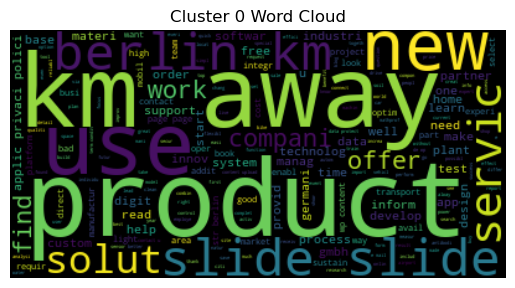

Cluster 1:
hivebuy compani wide order invoic solut hivebuy integr common erp system datev learn featur b b ecommerc catalogu workflow analyt vendor contract manag invoic manag integr benefit benefit financ benefit order benefit manag blog compani career login work featur b b ecommerc catalogu workflow analyt vendor contract manag invoic manag integr benefit benefit financ benefit order benefit manag price career blog compani career login test account contact deutsch english test account test account back hivebuy procur softwar mid market indirect procur never easi cost save softwar carefre packag process relat procur categori whether servic softwar hardwar reliabl intuit effici without effort test account autom workflow manag compani wide integr b b catalogu transpar invoic manag contract supplier manag effect cost manag use hivebuy familiar chaotic order process maverick buy incomplet non transpar expens intellig purchas softwar make problem thing past code setup implement digit purch

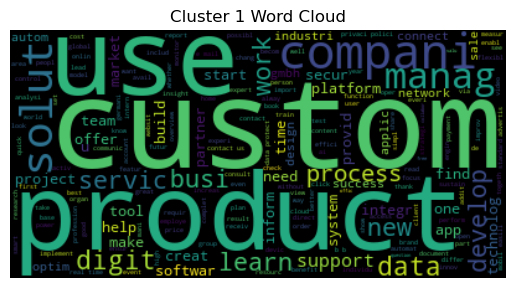

Cluster 2:
revers life insur get twice much life pension insur contact us nowfast conveni securesav time money payment day secur datayour data process secur accord data protect regulationsfre supportget expert knowledg free charg without obligationin less minutessign minut find find today get money back contact us life insur taken accord ecj bgh contract faulti lose money money back paid get even compens paid capit walk away polici winner confirm law ecj bgh revers process date applic lawsriskless costsbenefit expert knowledg complet free chargeyour life insur realli good invest payout custom cancel deduct tax fee advertis exampl result actual realiz us custom advantag revers us partner averag money back paid total free examin experienc lawyer side new contract bind data secur confidenti fast payout contact us happen revers soon receiv okay revers actuari calcul premium amount entitl event revers transact insur compani must reimburs amount includ sale acquisit cost well interest per ye

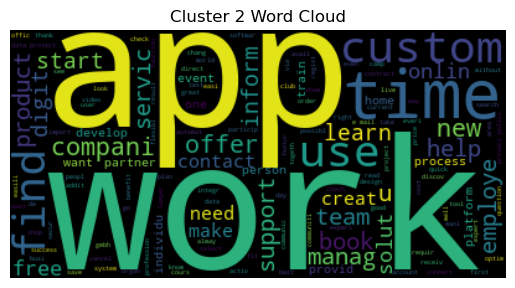

Cluster 3:
domain detail page sorri app doesnt work proper without javascript enabl pleas enabl continu
dayoffwer sorri dayoff doesnt work proper without javascript enabl pleas enabl continu
need enabl javascript run app smartlop blog
treasur educ pay construct sorri work websit thank patienc current work websit back short
grossjungigyou need enabl javascript run app
gridyou need enabl javascript run app
music licens servic brand agenc artist label songtradr songtradryou need enabl javascript run app
home stargazrsorri site wont work without javascript
ancora human clinic trial aiyou need enabl javascript run app
proleap run cobol cloud transform javapleas enabl javascript
andcharg dies webseit benötigt javascript bitt aktivier javascript deinem browser um dies seit zu benutzen sorri page requir javascript pleas make sure enabl javascript see content
easyfolio simpl investmentjavascript support turn browser pleas allow javascript view site https www enabl javascript com de
nea new real

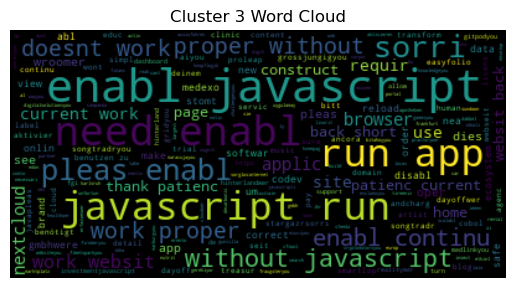

Cluster 4:
home open bank project skip content product open bank api platformblockchain airnodesolut psd complianceblockchain financeblockchain bankingblockchain consultinghackathonopen bank hackathonblockchain hackathonadvisori regulatori bodiesobp trainingecosystemsandboxesresourc blogreport case studiescontact us homebernat font lead open api platform bank api develop kickstart open bank initi pioneer open bank concept standard technolog sinc open bank project global standard open sourc api solut open bank obp inspir support region standard framework uk open bank stet berlin group drive fintech innov develop fintech use open bank project bank tap global communiti innov keen collabor exampl see ecosystem page technolog built fintech develop mind give superior experi unparallel access tool document boost product enhanc secur control control third parti relat use access control monitor authent obp api manag decid api expos revok access time solut deploy site behind bank firewal ensur l

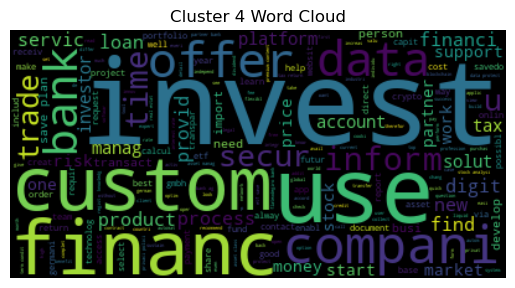

Cluster 5:
consciousu creat conscious tribe programm overview cu cu money event price us partner content newslett contact select page transform cultur organis scalabl person develop programm discov programm transform cultur sustain cost effici insid engag everyon organis blend learn programm scalabl inclus digit social holist intuit programm creat soil agil deliber development organis guid employe profound process self reflect discoveri solut orient dialogu peer along way deepen compass self other assum ownership creat meaning connect colleagu across organis inner work make new work possibl discov programm book demo person develop programm guarante impact holist blend learn approach enabl play habit build root behaviour scienc psycholog consolid intellect compass self reflect interact thus empow individu creat collect transform scalabl inclus sustain discov programm book demo find client say programm person develop programm individu organis transform increas employe engag organis creat

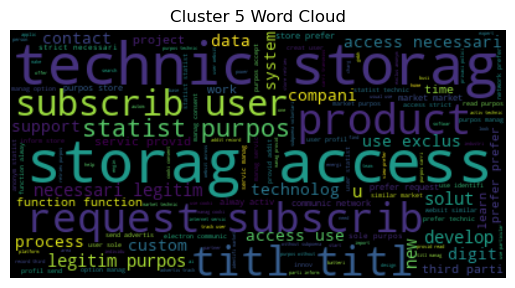

Cluster 6:
restub airbag freedom safeti water restub skip content close menu restub restub restub beach restub activ restub extrem pfd restub restub automat restub lifeguard swim buoy restub shop activ stand paddl swim kitesurf windsurf board snorkel row cano kayak fish profession rescu packag starter packag friend famili packag cooper shop new product brand restub product comparison take quiz add on restub co cartridg swim buoy add on merch activ recreat famili sport competit profession rescu stand paddl swim wind kitesurf board snorkel row kayak cano fish stori academi ambassador restub readi team blog faq store finder busi log instagram facebook youtub pinterest tiktok restub freedom safeti water restub restub restub beach restub activ restub extrem pfd restub restub automat restub lifeguard swim buoy restub shop activ stand paddl swim kitesurf windsurf board snorkel row cano kayak fish profession rescu packag starter packag friend famili packag cooper shop new product brand restub 

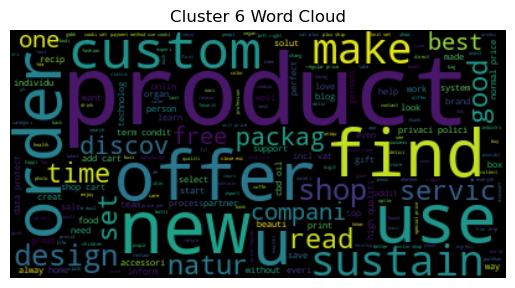

Cluster 7:
free medic pill remind mediteo app menuclos us mediteo work mediteo faq contact us handl medic easili mediteo free medic remind app let follow person therapi plan easili anytim anywher stay top health download mediteo today get remind difficult think regular intak medic mediteo app remind notif take pill medic reliabl time keep inform learn use medic proper side effect interact occur import inform simpli prepar alway stay organ plan regular intak alway keep track upcom medic intak easi list mediteo becom easi meet person therapi plan anywher time handl medic easili see work use mediteo faq section find inform question use mediteo answer question fill contact form tri answer question receiv answer us soon possibl feedback team work tireless adapt mediteo need need look forward feedback import valuabl suggest help us enorm support data privaci use mediteo without registr input person data person data pass third parti sinc data transmit encrypt anonym form neither partner acces

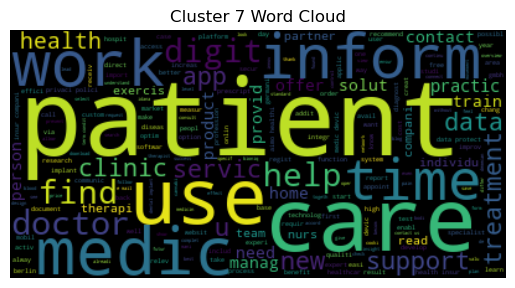

Cluster 8:
digit properti manag berlin berlin homedigit properti managementspeci properti managementrent properti managementsmart buildingsmart buildingenergi advicereferencesmoreoper cost accountingown loginten inquiriesblogapart offerscareercontactengmorehomedigit properti managementcondominium managementrent properti managementsmart buildingsmart buildingenergi advicereferencesmoreoper cost accountingown loginten inquiriesblogapart offerscareercontactenghomedigit properti managementspeci properti managementrent managementsmart buildingsmart buildingenergi consultingreferencesmoreutil billingown loginten inquiriesblogapart offerscareercontactengyour digit properti managementyour digit properti managementyour digit properti managementyour digit properti managementsmart transpar person learn digit properti managementyour digit properti managementyour digit properti managementyour digit properti managementsmart transpar person learn real estat manag developmenthabitalix digit properti m

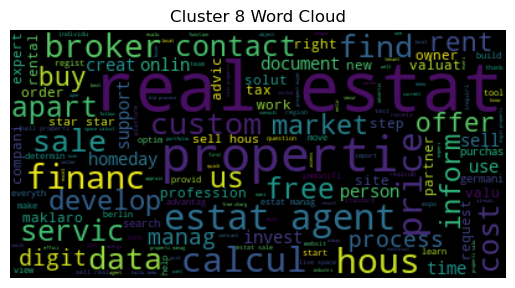

Cluster 9:
journey top kilimanjaro jambo kilimanjaro menu skip right header navig skip main contentbefor header follow us facebookinstagram choos languag en en fr want climb kilimanjarotrekk kenya mount kenya tanzania kilimanjaro lemosho rout macham rout marangu rout mount meru frequent ask question safari kenya day shimba hill tree lodg rainforest day tsavo east taita hill day safari masai mara lake nakuru nation park day ngorongoro serengeti maasai mara tanzania day tarangir ngorongoro day lake manyara tarangir ngorongoro day lake manyara serengeti ngorongoro day lake manyara serengeti ngorongoro tarangir day camp safari nation park frequent ask question beach zanzibar day zanzibar day zanzibar day zanzibar pangani frequent ask question import info flight book flight corona covid prepar health altitud sick equip travel insur worth know us stori testimoni contact request quot mobil menuchoos languag en en fr trekk kenya mount kenya tanzania kilimanjaro lemosho rout macham rout marangu

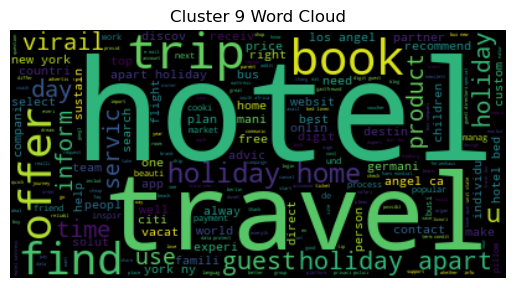

Cluster 10:
one data en de request demoproduct one data cartographi price support solut suppli chain optim data integr solut thought leadership public gartner report barc studi data doppio podcast newslett event compani join team job partner allianc newsroom contact us event highlight live webinar one data acceler tableau invest may cest regist free connect data creat new valu compani discov product make data mesh concept realiti learn solut product ad valu learn free onlin demo map technolog find expert knowledg data mesh data scienc ai co find proud work recogn world dynam chang comprehens use data determin product compani market act howev silo make data access difficult central technolog data lake crucial data knowledg depart lost prevent requir data product creat decentr data mesh concept one data cartographi technolog foundat come play open new perspect data imag corpor world creat comprehens access product sustain summari enabl data expert provid suitabl data product various depa

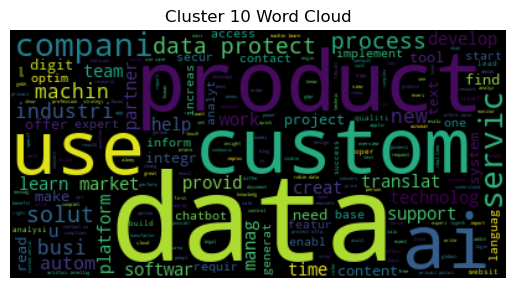

Cluster 11:
zoo de anim trust skip main content communiti sustain life dog cat shop cart becom communiti member expert team sustain assess sustain partner feedback job knowledg expert everyday tip recip season calendar food lexicon anim horoscop feed advic book recommend shop dog dog food dri dog food wet dog snack chew dog accessori barf dog dog insur health care dog dietari supplement dog product dog cat cat food dri cat food wet cat snack cat accessori barf cat health care cat nutrit cat product cat sale feed advic brand sustain rate leaderboard dog leaderboard cat pet portrait pet burial sale account search shop cart account search communiti menu expand menu hide becom communiti member expert team sustain assess sustain partner feedback job knowledg expand menu hide menu knowledg expert everyday tip recip season calendar food lexicon anim horoscop feed advic book recommend shop expand menu hide shop dog expand menu hide menu dog dri dog food wet dog food dog snack chew dog accessor

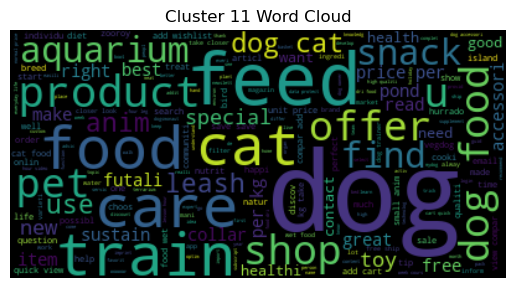

Cluster 12:
arculus jungheinrich compani load futur autonom mobil robot product blog career get touch product blog career reach get back interest modular productionwarehousefleetarcule amr herebi confirm arculus may contact consent may withdrawn time detail privaci polici engin powerhous mobil robot arculus jungheinrich compani agil ever whether underload transport good person applic arculus make intralogist process effici econom creat product part jungheinrich combin speed agil tech compani strength lead global intralogist player product autonom mobil robot amr multi purpos transport platform combin capabl self drive car economi mass product vda product real time controlledsoftwar platform plan simul optim full control one applic flexibl product flow good person materi handl fleet manag autonom mobil robot bottom line arculus employe k jungheinrich colleagu vision togeth bring autonom mobil robot life amazon proven autonom agv game changer arculus done lot right well posit lead transf

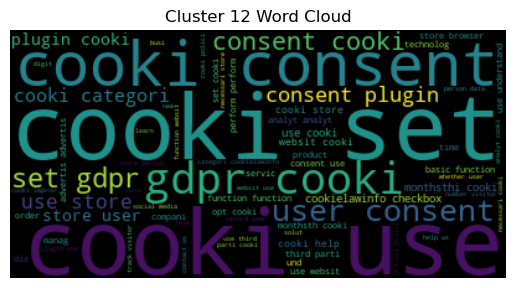

Cluster 13:
home greenflash home us mission refer press servic project charg network industri commerc retail petrol station larg area magazin news expert talk career choos page greenflash make compani sustain econom independ attract solut provid photovolta system tomorrow intellig network charg infrastructur electr storag numer energi sourc econom solut generat energi kwp guarante want lower oper cost protect environ time sit back relax get know contact telephon email info green flash deaddress fiskediek lingen known consult offer photovolta becom winner energi transit green electr roof make profit greenflash project offer electr storag make independ rise energi cost new regul use electr storag smart greenflash project offer charg infrastructur use electr charg infrastructur mani advantag charg card bill greenflash charg offer softwar benefit intellig energi system network monitor compon greenflash softwar solut smart network control monitor charg infrastructur batteri storag offer bes

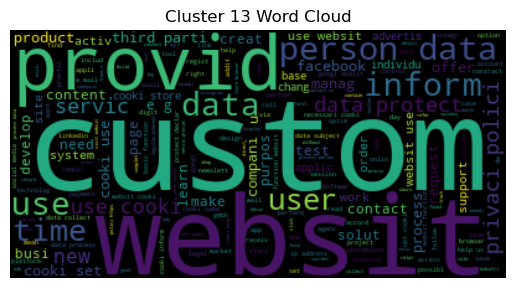

Cluster 14:
willkommen bei tvey select gift bald ist muttertag daher schenken wir euch auf das zweit setsetsprodukt tvey fußabdrucküb tveyunser produkteüb unswarenkorb lauf lebe leichtfüßigschenk dir schöne füße ohn lästige hornhaut einfach und bequem zum shopwofür unser produkt stehenvegannatürlichenursprungsklima neutralisiertfrei vonmikroplastikhergestelltin deutschlandzum shop schenk dir schöne füßeweg damit beginn dein pflegeroutin mit unserem hornhautweich und befrei dich von ihr ganz einfach mit sofort effekt massier dein lieblingscrem mit dem schwammkopf sanft die füße lang warten ist nicht nötig denn sie zieht schnell ein ein extra portion reichhaltig pflege schenkt dir unser nagel und körperölerfreu dich deinen wunderschönen füßen lauf tanz spring ohn schamgefühl zum shop läuftmit urea avocadoöl den warenkorb angebot zu viert ausführung wählen angebot befrei dich den warenkorbwa tvey liebhab innen sagenbekannt ausnewsletterwir freuen un wenn du die nächsten schritt mit un geh

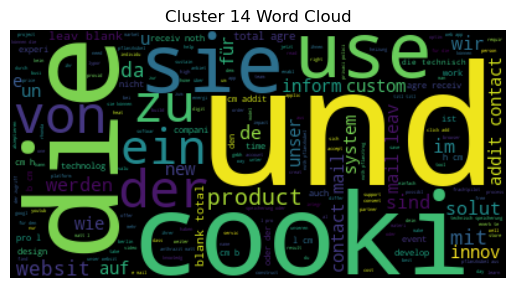

Cluster 15:
strong insur lifestyl helden de home product famili privat liabil famili liabil dog liabil hobbi drone protect hors liabil e bike bicycl protect home household content protect privat liabil busi profession liabil offic equip protect commerci drone liabil highlight hero communiti communiti product qualiti best protect guarante document chang servic chang servic flat rate principl deduct deduct servic contact contact report damag question answer press us helden de team job hero blog social media facebook instagram youtub pinterest partner affili becom partner friend support insur partner login finish home product famili privat liabil famili liabil dog liabil hobbi drone protect hors liabil e bike bicycl protect home household content protect person liabil busi profession liabil offic equip protect commerci drone liabil highlight hero communiti communiti product qualiti best protect guarante document exchang servic exchang servic flat rate principl deduct deduct servic contact

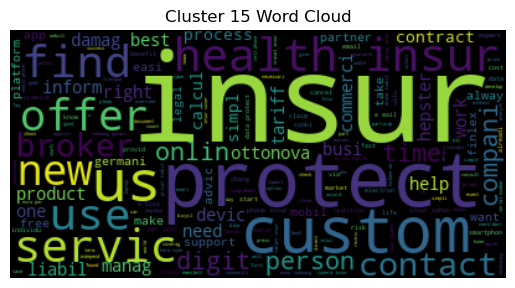

Cluster 16:
viamon gmbh home de home technolog servic contact faq legal notic secur pv power plant reli securityfor pv power plantsyou reli us viamon produc sell secur system photovolta power plant system consist self develop hardwar alarm respons servic way viamon secur optimis product renew energi work togeth epc power plant oper oandm world lead insur compani pv modul manufactur secur larg multi mw power plant smaller dedic solar system viamon one compani focus protect pv modul invert base experi made core compet german engin secur machin control internet thing iot first one develop integr monitor devic photovolta power plant viamon solut gps base geo fenc anti theft system far technolog instal sinc germani austria great britain spain switzerland namibia ghana nigeria chile india china dominican republ secur mwp instal power plant viamon gmbh merkurstr kaiserslautern germani e mail info viamon com url viamon com impressum legal notic tel fax viamon gmbh power browsertec
scienc media

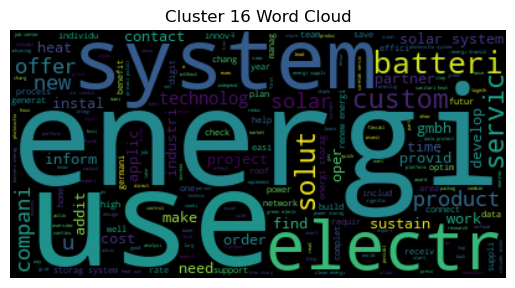

Cluster 17:
error fail get respons
error fail get respons
error fail get respons
error fail get respons
error fail get respons



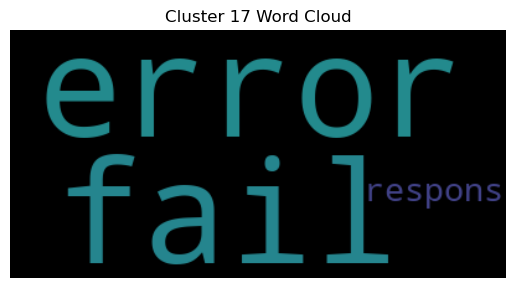

Cluster 18:
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error
error



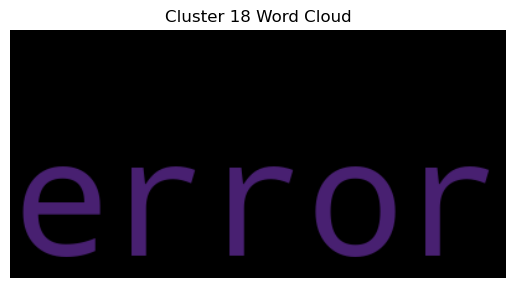

Cluster 19:
mivodo comparison portal car mobil leas think leas offer mobil de flexibl everi budget discov search leas deal electr car deposit privat leas commerci leas leas takeov new car use car insur mainten hybrid disabl discount car subscript deal electr car subscript provid brand vehicl type brand audi bmw merced benz ford jaguar land rover mini porsch volvo vw tesla magazin advisor lexicon deal log mivodo comparison portal car mobil car mobil portal listingtyp name prev next label choic label label label label displayvalu label displayvalu find label choic label label label label displayvalu label displayvalu find label label label displayvalu label displayvalu search new deal updat daili discov current editori select car deal various comparison categori deal privat deal frequent driver km per year peugeot per month need car long distanc definit take closer look deal hour ago hyundai ioniq per month inclus subscript today unbeat car subscript offer partner like drive current buy 

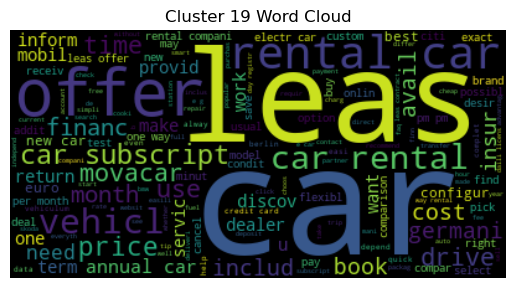

Cluster 20:
code test person test fyltura skip content kontakt fyltura de twitter linkedin home solut price product code test person test blog menu home solut price product code test person test blog hire best fyltura reduc risk cost wrong decis personnel select ensur satisfi candid recruit process find fyltura receiv comprehens evalu profession person suitabl candid offer code test person test singl sourc way ensur find best candid technic qualifi also person fit compani mission bring compani togeth right candid make recruit process uncompl effici everyon involv fyltura look compet programm dont want leav success personnel search chanc offer solut reliev manag recruit specialist depart recruit manag depart fyltura stand code test provid candid reach person support time via email helpdesk chat slack code test complex real world scenario e extens realist problem candid prove skill review carri man machin dont receiv generic report individu assess strength weak candid smooth recruit proc

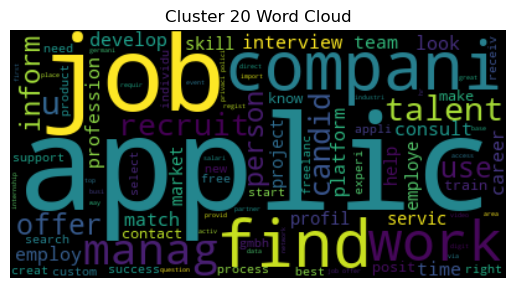

Cluster 21:
wildl shoe part generat direkt zum inhalt jetzt im shop neue modell für frühjahr und sommer click button close announc bar shop shop schuhe limit edit essenti frühling sommer herbst winter last chanc all kategorien accessoir einlegesohlen senkel bekleidung pflege gutschein all accessoir tanuki umi wildl shoe app über un über un warum wildl unser ansatz b corp blogazin neue wege gehen es gibt kein perfekt woll für artenvielfalt handwerk aus kirgistan garn aus hundewoll schritt zur zirkularität hanf lieb hanf lieb b corp zertifiziert wissen wissen über das produkt minimalschuh gründe für minimalschuh repair center servic größenfind help center showroom retour newslett p flegetipp event pop store live beratung einloggen land region eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur eur e

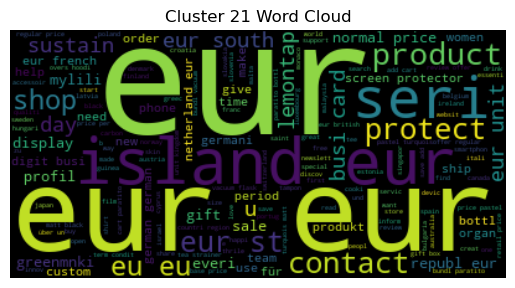

Cluster 22:
onlin cours clinic research clincoach onlin cours ich gcp onlin cours ich gcp onlin foundat cours ich gcp onlin advanc cours ich gcp onlin refresh cours mpdg onlin foundat cours mpdg onlin refresh cours mpdg onlin supplement cours clinic staff ich gcp onlin cours ich gcp onlin foundat cours ich gcp onlin advanc cours ich gcp onlin refresh cours mpdg onlin basic cours mpdg onlin refresh cours physician ich gcp onlin basic cours ich gcp onlin advanc cours ich gcp onlin refresh cours mpdg onlin basic cours mpdg onlin refresh cours mpdg onlin supplementari cours sponsor ich gcp onlin basic cours ich gcp onlin advanc cours ich gcp onlin refresh cours mpdg onlin basic cours mpdg onlin refresh cours mpdg onlin supplementari cours clincoach premium blog log shop cart product shop cart sign shop cart product shop cart search onlin cours ich gcp onlin cours ich gcp onlin foundat cours ich gcp onlin advanc cours ich gcp onlin refresh cours mpdg onlin foundat cours mpdg onlin refresh c

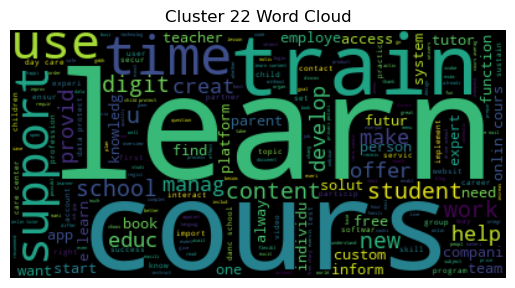

Cluster 23:
retrobrain randd physic mental activ play us motiv team technolog award philosophi partner mileston career appli benefit locat contact home career contact physic mental activ play retrobrain randd young compani heart hamburg sinc develop prevent therapeut effect video game senior citizen right start ask one question characterist game modern technolog scienc use togeth posit influenc health elder sick respons develop establish main product ehealth solut memor alreadi honor benchmark therapeut gamif industri lift basel repres throughout germani certifi class medic product regular fulli reimburs nurs care insur compani zu memor gestur control video game help camera movement player record transfer game intuit movement develop ergotherapi use navig game modul exampl virtual bowl motorcycl tabl tenni play clinic proven effect cours evalu project barmer posit effect memor various area mental physic health could proven includ promot coordin balanc attent memori well promot social i

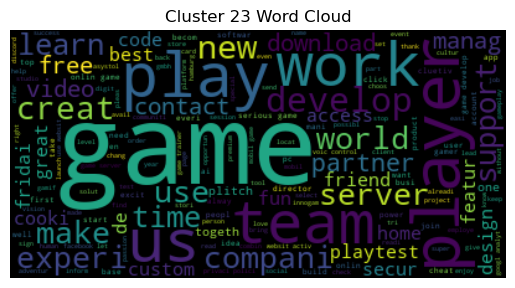

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Print texts for each cluster
for cluster in range(num_clusters):
    cluster_texts = df.loc[df['Cluster'] == cluster, 'Content']
    print(f"Cluster {cluster}:")
    for text in cluster_texts:
        print(text)
    print()

    # Plot relevant words of the cluster
    cluster_text = ' '.join(cluster_texts)
    wordcloud = WordCloud().generate(cluster_text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Cluster {cluster} Word Cloud")
    plt.show()



Visualisierung der Cluster-Hierarchie: Sie können die hierarchische Struktur der Cluster mithilfe eines Dendrogramms darstellen. Ein Dendrogramm zeigt die Verbindungen zwischen den Clustern als Baumstruktur. Sie können die Methode linkage aus der scipy-Bibliothek verwenden, um die Verbindungen zwischen den Clustern zu berechnen, und dann die Methode dendrogram verwenden, um das Dendrogramm zu zeichnen. Hier ist ein Beispielcode:

In [15]:
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

# Berechne die Verbindungen zwischen den Clustern
linkage_matrix = linkage(tfidf_matrix.toarray(), method='ward')

# Zeichne das Dendrogramm
plt.figure(figsize=(12, 6))
dendrogram(linkage_matrix, truncate_mode='level', p=num_clusters)
plt.xlabel('Texte')
plt.ylabel('Distanz')
plt.title('Hierarchisches Clustering Dendrogramm')
plt.show()



Visualisierung der Cluster-Ähnlichkeiten: Sie können die Ähnlichkeiten zwischen den Clustern mithilfe einer Heatmap darstellen. Eine Heatmap zeigt die Ähnlichkeitswerte als Farbmatrix an. Sie können die Methode pairwise_distances aus der sklearn.metrics-Bibliothek verwenden, um die Ähnlichkeitsmatrix zwischen den Clustern zu berechnen, und dann die Methode imshow aus der matplotlib.pyplot-Bibliothek verwenden, um die Heatmap zu zeichnen. Hier ist ein Beispielcode:

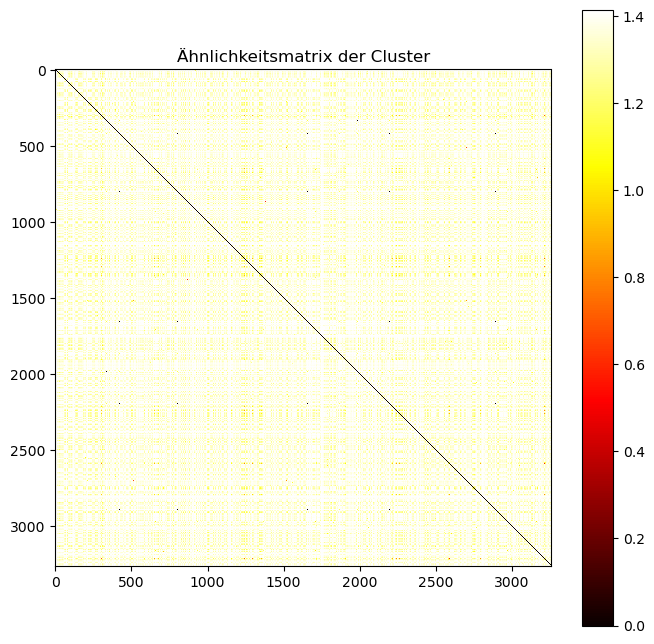

In [13]:
from sklearn.metrics import pairwise_distances
import numpy as np

# Berechne die Ähnlichkeitsmatrix zwischen den Clustern
cluster_distances = pairwise_distances(tfidf_matrix.toarray(), metric='euclidean')

# Zeichne die Heatmap
plt.figure(figsize=(8, 8))
plt.imshow(cluster_distances, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Ähnlichkeitsmatrix der Cluster')
plt.show()

Interpretation der Cluster: Betrachten Sie die Texte innerhalb jedes Clusters und versuchen Sie, gemeinsame Themen oder Charakteristika zu identifizieren. Lesen Sie einige der Texte in jedem Cluster, um ein Verständnis dafür zu entwickeln, welche Art von Inhalten oder Eigenschaften die Texte in einem Cluster teilen könnten. Sie können auch deskriptive Statistiken wie die Anzahl der Texte in jedem Cluster oder die durchschnittliche Ähnlichkeit zwischen den Texten in einem Cluster berechnen, um weitere Informationen über die Cluster zu gewinnen.